In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
import logging
import logging.config
import shutil
import os
import os.path as path

try:
    # py3
    from collections.abc import Mapping
except ImportError:
    from collections import Mapping

import numpy as np
import yaml

from yass import set_config
from yass import preprocess, detect, cluster, deconvolute
from yass import templates as get_templates
from yass import read_config

from yass.util import load_yaml, save_metadata, load_logging_config_file
from yass.explore import RecordingExplorer, SpikeTrainExplorer, RecordingExplorer
from yass.threshold import dimensionality_reduction as dim_red

from yass.batch import RecordingsReader
import scipy.io
import numpy as np
from scipy.spatial.distance import pdist, squareform, cdist

/home/peter/miniconda3/envs/peter/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [4]:
config = '/ssd/data/peter/yass-examples/config_ejfull.yaml'
logger_level='DEBUG'
clean=False
output_dir='tmp/'
complete=False

In [5]:
# load yass configuration parameters
set_config(config)
CONFIG = read_config()
ROOT_FOLDER = CONFIG.data.root_folder
TMP_FOLDER = path.join(ROOT_FOLDER, output_dir)

In [6]:
# remove tmp folder if needed
if os.path.exists(TMP_FOLDER) and clean:
    shutil.rmtree(TMP_FOLDER)

# create TMP_FOLDER if needed
if not os.path.exists(TMP_FOLDER):
    os.makedirs(TMP_FOLDER)

# load logging config file
logging_config = load_logging_config_file()
logging_config['handlers']['file']['filename'] = path.join(TMP_FOLDER,
                                                           'yass.log')
logging_config['root']['level'] = logger_level

# configure logging
logging.config.dictConfig(logging_config)

# instantiate logger
logger = logging.getLogger(__name__)

# preprocess
(standarized_path,
 standarized_params,
 channel_index,
 whiten_filter) = preprocess.run(output_directory=output_dir)

# detect
(score, spike_index_clear,
 spike_index_all) = detect.run(standarized_path,
                               standarized_params,
                               channel_index,
                               whiten_filter,
                               output_directory=output_dir)

yass.preprocess.run@run 08/03/2018 13:40:45 INFO Output dtype for transformed data will be float32
yass.preprocess.run@run 08/03/2018 13:40:45 INFO Temporary folder /hdd/data/peter/ejbin/tmp/ already exists, output will be stored there
yass.detect.run@run_neural_network 08/03/2018 13:40:45 INFO Loading "/hdd/data/peter/ejbin/tmp/score_clear.npy", "/hdd/data/peter/ejbin/tmp/spike_index_clear.npy" and "/hdd/data/peter/ejbin/tmp/spike_index_collision.npy"


In [7]:
path_to_spike_train_clear = path.join(TMP_FOLDER, 'spike_train_clear.npy')
if os.path.exists(path_to_spike_train_clear):
    spike_train_clear = np.load(path_to_spike_train_clear)

else:
    spike_train_clear = cluster.run(score, spike_index_clear)
    logging.info('Saving clear spike train in {}'.format(path_to_spike_train_clear))
    np.save(path_to_spike_train_clear, spike_train_clear)



In [8]:
path_to_templates = path.join(TMP_FOLDER, 'templates.npy')
path_to_clear_spike_train_after_merge = path.join(TMP_FOLDER, 'templates.npy')
if os.path.exists(path_to_clear_spike_train_after_merge):
    templates = np.load(path_to_templates)
    spike_train_clear = np.load(path_to_clear_spike_train_after_merge)
else:
    # get templates
    templates, spike_train_clear = get_templates.run(spike_train_clear)   
    logging.info('Saving templates in {}'.format(path_to_templates))
    np.save(path_to_templates, templates)
    np.save(path_to_clear_spike_train_after_merge, spike_train_clear)



In [11]:
spike_train, templates = deconvolute.run(spike_index_all, templates,
                              output_directory=output_dir)


spt_2 = spike_train
tmp_2 = np.transpose(templates,(1,0,2))

root@run 06/03/2018 12:48:11 DEBUG Starting deconvolution. templates.shape: (512, 61, 1205), spike_index.shape: (77648321, 2)
make list done
shifting done
svd done
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
start
yass.batch.generator@__init__ 06/03/2018 13:04:22 DEBUG Max memory: 95.37 MB. Itemsize: 4 bytes
yass.batch.batch@multi_channel_apply 06/03/2018 13:04:22 INFO Applying function yass.deconvolute.deconvolve.deconvolve...
yass.batch.generator@multi_channel 06/03/2018 13:04:22 DEBUG Observations per channel: 36,014,800. Number of channels: 512. Total ob

381.80660524360064
273.1706500222033
261.06119283759926
219.56612202716337
274.2577912589454
119.72941210267038
133.70286483725295
234.48398292736897
77.47832729937971
106.88491424611152
ends
run start
run 2 starts
21001.269752001044
13340.25541915758
3946.473947561648
2387.299159745229
2182.1214715980555
1746.5324475209086
1519.2787974946918
1600.1696570877318
922.8379845919139
1401.22949951585
763.6701274648442
997.3599122774624
678.348150153924
950.070514462252
668.0574319212319
655.0964758854518
614.7791172779753
333.2829391881414
1043.748521933047
477.4282742088094
405.15648535835976
449.3551096622755
379.50817437032424
619.1703648920578
654.6134317897204
116.489645400354
137.17910456422163
69.90392505737623
58.13118504052807
63.1554661601366
ends
run start
run 2 starts
23070.34027434416
8449.780804720727
3299.472216527734
2786.232602458532
2263.684679281987
2114.7148060414597
1830.3576904850847
1330.956672907659
1674.0223328251836
1007.9297411902771
824.7649719029653
1295.9689542

993.9925609942725
1177.998424835197
887.2857510720647
721.8130064780677
545.7053815097834
698.4338279827095
655.1839603499515
451.774012430149
354.6099340493956
315.61629243481013
813.7046907479944
616.4923255534375
451.8224615291208
348.4615978400909
199.67283056494125
150.80522498600658
491.11420556420626
130.61378232265156
168.13517405859034
109.23310243935674
74.91378769578063
70.63055430980216
100.10855359417161
57.94711333486771
ends
run start
run 2 starts
21399.014867109923
5103.775083943525
3143.9689771328817
2225.453565820554
1789.1138772960435
1921.9771044093354
1204.1601561643297
1068.068467199464
1079.9603013142814
1528.4674814096743
618.0367103269671
555.0391770956719
794.5720076584505
952.7501732087799
1002.7215421163005
527.6906434226175
991.3303044209242
582.6508395346136
316.35188513467233
512.1841496988808
729.4699817443327
256.34691828613427
113.15095409745686
431.1038031105529
118.54073091309556
80.64321679667785
84.93296914058578
189.7012956716527
50.26561756478009

709.1707837571782
736.1851570143646
316.9359702849921
1187.9930621723051
506.45632932943545
234.32695803569436
298.10590304757034
173.94632522272025
148.7219055257201
190.2467860427521
174.42120236681754
257.6898601507644
246.3940687217721
ends
run start
run 2 starts
22792.944119166128
12187.480989978254
4058.561552190443
2653.3003167100155
1979.0094166148392
1885.3225796119384
1132.174211854981
977.5145698834726
1572.7143014964286
1216.3328547152455
822.5460789229196
799.5490361303218
971.9605002331587
482.9501045627992
477.2475914704935
418.2730507766174
718.176900570608
728.5948308230797
969.1662820024974
300.23843563549906
299.76866454766036
182.1501519844419
267.66259815940793
374.1139390230527
60.70818347524539
182.7535271251843
ends
run start
run 2 starts
21809.46603733663
4656.068206163293
3220.1159870518504
2411.560618161441
1982.7877943239137
1803.920629457667
1461.8715619213378
1632.223730852525
1239.2651960675844
1018.7929947705277
862.3115037423404
1401.2306388072332
1572.

1148.7144667843681
1265.5833448452117
700.3735217004985
631.2435493275952
1269.9792976134795
1088.4984400566063
791.7831424735527
484.20265914022366
721.0415799418558
602.0948601923385
666.9450179403711
300.50929453601157
461.48606538453805
253.06505392298996
342.00219798863145
80.84480909892056
99.43641024324415
ends
run start
run 2 starts
22277.68861194215
7413.276818346272
5545.776056189153
4364.186563099842
2341.792468027409
1492.442369959536
1488.5668624842838
1576.577083203174
983.7023160031549
955.3762494986988
1031.3271094073964
680.2123689623443
555.1946106001055
952.0744602185039
669.5910918830696
549.2703125369342
482.7177260042936
878.4969797924232
380.88548137073303
269.72812141954364
210.2097223123352
177.28761523596359
143.05051017200776
116.07198937280805
308.4760177736173
112.6306908515183
62.21942058346389
ends
run start
run 2 starts
21700.59999144838
7484.835902373585
3997.0627443294297
2639.2856973668995
2214.501909689121
1927.5503020247559
1827.147480683882
1384.58

KeyboardInterrupt: 

# Deconv works fine?

In [9]:
import os.path
import logging

import numpy as np

from yass.deconvolute.util import svd_shifted_templates, calculate_temp_temp, small_shift_templates, make_spt_list, clean_up
from yass.deconvolute.deconvolve import deconvolve, fix_indexes
from yass.geometry import make_channel_index
from yass import read_config
from yass.batch import BatchProcessor

In [10]:
spike_index = spike_index_all

In [11]:
CONFIG = read_config()

logging.debug('Starting deconvolution. templates.shape: {}, '
              'spike_index.shape: {}'
              .format(templates.shape, spike_index.shape))

# necessary parameters
n_channels, n_temporal_big, n_templates = templates.shape
templates = np.transpose(templates,(2,1,0))

n_shifts = CONFIG.deconvolution.upsample_factor
n_explore = CONFIG.deconvolution.n_explore
threshold_d = CONFIG.deconvolution.threshold_dd
n_features = CONFIG.deconvolution.n_features
max_spikes = CONFIG.deconvolution.max_spikes

# get spike_index as list
spt_list = make_spt_list(spike_index, n_channels)    
spike_index = 0
print('make list done')

# upsample template
shifted_templates = small_shift_templates(templates, n_shifts)

print('shifting done')
# svd templates
temporal_features, spatial_features = svd_shifted_templates(shifted_templates, n_features)

print('svd done')

# calculate convolution of pairwise templates
temp_temp = calculate_temp_temp(temporal_features, spatial_features)
temp_temp *= 2



root@<module> 08/03/2018 13:40:59 DEBUG Starting deconvolution. templates.shape: (2173499, 2), spike_index.shape: (70724108, 2)


ValueError: not enough values to unpack (expected 3, got 2)

In [98]:
np.save('temp_temp.npy', temp_temp)

In [17]:
# load yass configuration parameters
set_config(config)
CONFIG = read_config()
ROOT_FOLDER = CONFIG.data.root_folder
TMP_FOLDER = path.join(ROOT_FOLDER, output_dir)

In [18]:
output_directory='tmp/'
recordings_filename='standarized.bin'

rec = RecordingsReader(os.path.join(CONFIG.data.root_folder,
                                           output_directory,
                                        recordings_filename))

In [37]:
data_start = 10000
data_end = 60000
# get offset that will be applied
offset = 0
recordings = np.copy(rec[data_start:data_end])

n_templates, n_shifts, waveform_size, n_channels = shifted_templates.shape
R = int((waveform_size-1)/2)

principal_channels = np.argmax(np.max(np.abs(shifted_templates),(1,2)), 1)
norms = np.sum(np.square(shifted_templates),(2,3))

In [38]:
import datetime

In [ ]:
np.max(np.abs(spatial_features), (1,2,3))

In [81]:
visible_channels = np.max(np.abs(spatial_features), (1,2)) > th

In [152]:
k = 0 
spt = spt_list[principal_channels[k]]
spt = spt[np.logical_and(spt >= data_start + 100,
                         spt < data_end - 100)]
spt = spt - data_start + offset

print((datetime.datetime.now()-_b).total_seconds())
_b = datetime.datetime.now()

ch_idx = np.where(visible_channels[k])[0]
wf = recordings[
    spt[:, np.newaxis] + np.arange(
        -R-n_explore, n_explore+R+1)][:,:, ch_idx]
print((datetime.datetime.now()-_b).total_seconds())
_b = datetime.datetime.now()



183.75018
0.018029


In [175]:
rows = (spt[:, np.newaxis] + np.arange(
        -R-n_explore, n_explore+R+1))
wf = (((recordings.ravel()[(
   ch_idx + (rows * recordings.shape[1]).reshape((-1,1))
   ).ravel()]).reshape(rows.size, ch_idx.size)).reshape((spt.shape[0], -1, ch_idx.shape[0])))

In [162]:
rows = (spt[:, np.newaxis] + np.arange(
        -R-n_explore, n_explore+R+1)).ravel()

In [156]:
ch_idx + ()

array([  0,   1,   4,   5,   8,   9,  12,  25,  45,  61,  98, 101, 106,
       114, 156, 157, 367, 371, 375, 383, 448, 449, 456, 457, 464])

In [155]:
recordings.ravel()[]

(25600000,)

In [153]:
wf.shape

(275, 65, 25)

In [ ]:
_b = datetime.datetime.now()
d_matrix = np.ones((recordings.shape[0],
                    n_templates,
                    n_shifts), 'float32')*-np.Inf

for k in range(n_templates):
    print(k)
    spt = spt_list[principal_channels[k]]
    spt = spt[np.logical_and(spt >= data_start + 100,
                             spt < data_end - 100)]
    spt = spt - data_start + offset

    print((datetime.datetime.now()-_b).total_seconds())
    
    ch_idx = np.where(visible_channels[k])[0]
    times = (spt[:, np.newaxis] + np.arange(
            -R-n_explore, n_explore+R+1))
    wf = (((recordings.ravel()[(
       ch_idx + (times * recordings.shape[1]).reshape((-1,1))
       ).ravel()]).reshape(times.size, ch_idx.size)).reshape((spt.shape[0], -1, ch_idx.shape[0])))
    print((datetime.datetime.now()-_b).total_seconds())
    
    
    spatial_dot = np.matmul(spatial_features[k][np.newaxis, np.newaxis, :, :, ch_idx],
                            wf[:, :, np.newaxis, :, np.newaxis]
                           )[:,:,:,:,0].transpose(0, 2, 1, 3)
    print((datetime.datetime.now()-_b).total_seconds())
    
    
    dot = np.zeros((spt.shape[0], 2*n_explore+1, n_shifts))
    for j in range(2*n_explore+1):
        dot[:, j] = np.sum(spatial_dot[
            :, :, j:j+2*R+1]*temporal_features[k][np.newaxis], (2, 3))
    print((datetime.datetime.now()-_b).total_seconds())
    

    d_matrix[spt[:, np.newaxis] + np.arange(-n_explore,n_explore+1), k] = 2*dot  - \
        norms[k][np.newaxis, np.newaxis]
    print((datetime.datetime.now()-_b).total_seconds())




0
0.216473
0.220652
0.225964
0.229783
0.229995
1
0.230371
0.233986
0.239225
0.242822
0.243016
2
0.243306
0.248843
0.263633
0.266177
0.266319
3
0.266644
0.273489
0.290723
0.294386
0.294607
4
0.294974
0.299008
0.305058
0.30862
0.308912
5
0.309232
0.313123
0.318123
0.322814
0.323021
6
0.32342
0.334657
0.36513
0.370681
0.370897
7
0.37122
0.381588
0.411292
0.416631
0.416859
8
0.417295
0.424424
0.445797
0.448839
0.448985
9
0.449316
0.452537
0.457331
0.460234
0.460436
10
0.460724
0.466572
0.481473
0.484484
0.484713
11
0.485078
0.490105
0.501335
0.5053
0.505454
12
0.505789
0.510521
0.520721
0.524644
0.524843
13
0.525134
0.528802
0.533995
0.537902
0.538098
14
0.538389
0.544045
0.560034
0.562623
0.562823
15
0.563113
0.576532
0.623482
0.627361
0.627575
16
0.627943
0.641128
0.69168
0.694714
0.694925
17
0.695293
0.700792
0.715354
0.718251
0.718454
18
0.718747
0.722815
0.727697
0.73021
0.730413
19
0.730782
0.735312
0.743351
0.747154
0.747368
20
0.747736
0.754822
0.769095
0.772956
0.773167
21
0.77348

4.13727
4.137521
179
4.137827
4.141637
4.152254
4.155195
4.15532
180
4.155611
4.158672
4.166166
4.168848
4.169027
181
4.169279
4.176002
4.196081
4.199436
4.199565
182
4.199855
4.204769
4.218018
4.22067
4.220857
183
4.221114
4.22225
4.223578
4.226252
4.226366
184
4.226652
4.229418
4.234516
4.237166
4.237284
185
4.237576
4.241915
4.250191
4.254119
4.254293
186
4.254551
4.260483
4.273549
4.277592
4.277772
187
4.278026
4.28057
4.286734
4.28843
4.288515
188
4.288807
4.29285
4.303322
4.305647
4.305772
189
4.306079
4.316962
4.350813
4.35587
4.355995
190
4.356447
4.362263
4.373881
4.379005
4.37917
191
4.379491
4.389839
4.420095
4.42526
4.425491
192
4.425777
4.432163
4.447819
4.453058
4.453294
193
4.453579
4.459294
4.474478
4.477627
4.477826
194
4.4782
4.483575
4.496451
4.499547
4.499799
195
4.500118
4.50672
4.521158
4.526596
4.526816
196
4.527079
4.529862
4.533088
4.538451
4.538643
197
4.538905
4.544538
4.555863
4.561008
4.561217
198
4.56158
4.565588
4.577479
4.579775
4.579916
199
4.580209
4.5

8.122758
8.14551
8.149776
8.149981
354
8.150345
8.157328
8.174339
8.177926
8.178064
355
8.178442
8.181659
8.187361
8.191455
8.191653
356
8.191933
8.193332
8.194882
8.198964
8.19914
357
8.199406
8.204267
8.216143
8.21888
8.219014
358
8.21933
8.222965
8.229758
8.233722
8.233901
359
8.234169
8.241052
8.256461
8.260453
8.260648
360
8.260921
8.26673
8.279691
8.283928
8.284129
361
8.284431
8.289556
8.299944
8.303378
8.303562
362
8.303831
8.308181
8.319329
8.321717
8.321863
363
8.322204
8.326983
8.339689
8.34316
8.34335
364
8.343645
8.347011
8.354432
8.358019
8.358163
365
8.358474
8.360789
8.364523
8.368248
8.368404
366
8.368726
8.372181
8.379447
8.382449
8.382574
367
8.382881
8.397018
8.446273
8.449436
8.449634
368
8.449983
8.45215
8.455161
8.458313
8.458488
369
8.458764
8.463287
8.472071
8.475263
8.475445
370
8.475724
8.478056
8.481584
8.484773
8.484946
371
8.485225
8.490456
8.504535
8.507798
8.507936
372
8.508251
8.514297
8.529882
8.533152
8.533296
373
8.533675
8.538631
8.550121
8.553371
8

In [145]:
import numpy as np
import logging
from scipy.signal import argrelmax



In [147]:
spike_train = np.zeros((0, 2), 'int32')
max_d = np.max(d_matrix, (1,2))
max_val = np.max(max_d)
while max_val > threshold_d:
    # find spike time
    print(max_val)
    peaks = argrelmax(max_d)[0]
    idx_good = peaks[np.argmax(
        max_d[peaks[:, np.newaxis] + np.arange(-2*R,2*R+1)],1) == (2*R)]
    spike_time = idx_good[max_d[idx_good] > threshold_d]
    template_id, max_shift = np.unravel_index(
        np.argmax(np.reshape(d_matrix[spike_time],
                             (spike_time.shape[0], -1)),1),
        [n_templates, n_shifts])

    # prevent refractory period violation
    rf_area = spike_time[:, np.newaxis] + np.arange(-R,R+1)
    rf_area_t = np.tile(template_id[:,np.newaxis],(1, 2*R+1))
    d_matrix[rf_area, rf_area_t] = -np.Inf
    rf_area = np.reshape(rf_area, -1)
    max_d[rf_area] = np.max(d_matrix[rf_area], (1,2))

    # update nearby times
    time_affected = np.zeros(max_d.shape[0], 'bool')
    for j in range(spike_time.shape[0]):
        t_neigh, k_neigh = np.where(
            d_matrix[spike_time[j]-2*R:spike_time[j]+2*R, :, 0] > -np.Inf)
        t_neigh_abs = spike_time[j] + t_neigh - 2*R
        d_matrix[t_neigh_abs, k_neigh] -= temp_temp[
            template_id[j], k_neigh, max_shift[j], :, t_neigh]
        time_affected[t_neigh_abs] = 1

    max_d[time_affected] = np.max(d_matrix[time_affected], (1,2))
    max_val = np.max(max_d)

    # update nearby times
    #for j in range(spike_time.shape[0]):
    #    t_neigh = np.where(max_d[spike_time[j]-2*R:spike_time[j]+2*R+1] > -np.Inf)[0]
    #    t_neigh_abs = spike_time[j] + t_neigh - 2*R
    #    d_matrix[t_neigh_abs] -= temp_temp[template_id[j], :, max_shift[j], :, t_neigh]
    #    max_d[t_neigh_abs] = np.max(d_matrix[t_neigh_abs],(1,2))  
    #max_val = np.max(max_d)


    spike_train_temp = np.hstack((spike_time[:, np.newaxis],
                                  template_id[:, np.newaxis]))
    spike_train = np.concatenate((spike_train, spike_train_temp), 0)         



1737.6384
1672.8727
1439.1461
1276.1211
1220.0005
1141.9722
1285.4763
1043.9143
1002.81476
1149.4507
975.07227
906.2919
855.2311
887.23755
812.4896
733.1718
726.20636
762.2484
666.6979
755.4122
702.24585
656.5509
559.4284
576.2162
663.17255
704.27905
794.6603
690.5852
464.90527
517.6581
627.355
644.6239
417.24472
523.1431
452.7907
414.05212
736.0053
447.75916
432.6271
374.2452
454.01758
527.1637
534.76587
566.4554
425.94928
430.57108
349.6474
456.71722
336.4551
316.3304
439.70578
472.579
414.4408
355.85574
644.9226
271.69403
361.01633
332.67688
241.85767
241.25317
205.38559
678.4448
318.33276
305.4667
149.06694
228.7438
93.49744
120.26976
163.80188
139.11456
90.429375
205.8196
411.31448
84.452965
75.471214
84.274345
74.32991
56.733295


In [115]:
spike_train = np.zeros((0, 2), 'int32')
max_d = np.max(d_matrix, (1,2))
max_val = np.max(max_d)

# find spike time
peaks = argrelmax(max_d)[0]
idx_good = peaks[np.argmax(
    max_d[peaks[:, np.newaxis] + np.arange(-2*R,2*R+1)],1) == (2*R)]
spike_time = idx_good[max_d[idx_good] > threshold_d]
template_id, max_shift = np.unravel_index(
    np.argmax(np.reshape(d_matrix[spike_time],
                         (spike_time.shape[0], -1)),1),
    [n_templates, n_shifts])

# prevent refractory period violation
rf_area = spike_time[:, np.newaxis] + np.arange(-R,R+1)
rf_area_t = np.tile(template_id[:,np.newaxis],(1, 2*R+1))
d_matrix[rf_area, rf_area_t] = -np.Inf
max_d[rf_area] = np.max(d_matrix[rf_area], (2,3))



In [116]:
d_matrix_before = np.copy(d_matrix)

In [117]:
max_d_before = np.copy(max_d)

In [118]:
_b = datetime.datetime.now()
# update nearby times
for j in range(spike_time.shape[0]):
    t_neigh = np.where(max_d[spike_time[j]-2*R:spike_time[j]+2*R+1] > -np.Inf)[0]
    t_neigh_abs = spike_time[j] + t_neigh - 2*R
    d_matrix[t_neigh_abs] -= temp_temp[template_id[j], :, max_shift[j], :, t_neigh]
    max_d[t_neigh_abs] = np.max(d_matrix[t_neigh_abs],(1,2))
print((datetime.datetime.now()-_b).total_seconds())

1.077966


In [120]:
max_d2 = np.max(d_matrix,(1,2))

In [121]:
kk = max_d2 - max_d

/home/peter/miniconda3/envs/peter/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in subtract
  """Entry point for launching an IPython kernel.


In [122]:
kk = max_d2 - max_d
np.sum(np.abs(kk[~np.isnan(kk)]))

/home/peter/miniconda3/envs/peter/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in subtract
  """Entry point for launching an IPython kernel.


0.0

In [82]:
idxx = np.where(~np.isnan(kk))[0]

In [83]:
max_d2[idxx]

array([-209.46473705, -127.34250981,   82.07775617, ..., 1200.09383432,
       1035.37501937,  421.13861277])

In [99]:
idxx[-1]

999901

In [68]:
_b = datetime.datetime.now()
# update nearby times
for j in range(spike_time.shape[0]):
    t_neigh, k_neigh = np.where(
        d_matrix[spike_time[j]-2*R:spike_time[j]+2*R, :, 0] > -np.Inf)
    t_neigh_abs = spike_time[j] + t_neigh - 2*R
    d_matrix[t_neigh_abs, k_neigh] -= temp_temp2[
        template_id[j], k_neigh, max_shift[j], :, t_neigh]

max_d = np.max(d_matrix,(1,2))
print((datetime.datetime.now()-_b).total_seconds())

1.188221


array([-inf, -inf, -inf, ..., -inf, -inf, -inf])

In [57]:
d_matrix[t_affected]

(47, 103, 3)

In [115]:

spike_train = np.zeros((0, 2), 'int32')
temp_temp2 = 2*temp_temp
max_d = np.max(d_matrix, (1,2))
max_val = np.max(max_d)
while max_val > threshold_d:
    # find spike time
    peaks = argrelmax(max_d)[0]
    idx_good = peaks[np.argmax(
        max_d[peaks[:, np.newaxis] + np.arange(-2*R,2*R+1)],1) == (2*R)]
    spike_time = idx_good[max_d[idx_good] > threshold_d]
    template_id, max_shift = np.unravel_index(
        np.argmax(np.reshape(d_matrix[spike_time],
                             (spike_time.shape[0], -1)),1),
        [n_templates, n_shifts])

    # prevent refractory period violation
    rf_area = spike_time[:, np.newaxis] + np.arange(-R,R+1)
    rf_area_t = np.tile(template_id[:,np.newaxis],(1, 2*R+1))
    d_matrix[rf_area, rf_area_t] = -np.Inf
    max_d[rf_area] = -np.Inf

    # update nearby times
    for j in range(spike_time.shape[0]):
        t_neigh, k_neigh = np.where(
            d_matrix[spike_time[j]-2*R:spike_time[j]+2*R, :, 0] > -np.Inf)
        t_neigh_abs = spike_time[j] + t_neigh - 2*R
        d_matrix[t_neigh_abs, k_neigh] -= temp_temp2[
            template_id[j], k_neigh, max_shift[j], :, t_neigh]

    max_d = np.max(d_matrix, (1,2))
    max_val = np.max(max_d)

    spike_train_temp = np.hstack((spike_time[:, np.newaxis],
                                  template_id[:, np.newaxis]))
    spike_train = np.concatenate((spike_train, spike_train_temp), 0)         



31779.38695365908
21921.99558129138
11410.670923378486
5999.66022414771
5553.020459040379
4778.756979320784
2002.409713515063
1550.1031555519603
1116.53333896114
735.8537487698939
644.1894497279845
561.4081968771986
515.1092492516476
496.8377462571833
412.41868996694484
463.35396790485066
358.2166411681349
302.99986079434126
289.5502592190855
337.4494048860156
243.6563685935339
243.0866721232618
230.24855970628073
115.04195598448587
99.61617673887446
183.79520965241443
129.79101440535658
106.78585255947428
72.24017710545013
70.23580252855828
44.408582390480206
78.01938077349399


In [110]:
print(np.max(d_max_along_shift))
max_d = np.max(d_max_along_shift, 1)
peaks = argrelmax(max_d)[0]
idx_good = peaks[np.argmax(max_d[peaks[:, np.newaxis] + np.arange(-2*R,2*R+1)],1) == (2*R)]
spike_time = idx_good[max_d[idx_good] > threshold_d]
template_id, max_shift = np.unravel_index(
    np.argmax(np.reshape(d_matrix[spike_time],
                         (spike_time.shape[0], -1)),1),
    [n_templates, n_shifts])

rf_area = spike_time[:, np.newaxis] + np.arange(-R,R+1)
rf_area_t = np.tile(template_id[:,np.newaxis],(1, 2*R+1))
d_matrix[rf_area, rf_area_t] = -np.Inf
d_max_along_shift[rf_area, rf_area_t] = -np.Inf

print(spike_time.shape[0])
for j in range(spike_time.shape[0]):
    t_neigh, k_neigh = np.where(d_max_along_shift[spike_time[j]-2*R:spike_time[j]+2*R] > -np.Inf)
    
    t_neigh2, k_neigh2 = np.where(
        d_matrix[spike_time[j]-2*R:spike_time[j]+2*R, :, 0] > -np.Inf)
       
    t_neigh_abs = spike_time[j] + t_neigh - 2*R
    d_matrix[t_neigh_abs, k_neigh] -= 2*temp_temp[template_id[j], k_neigh, max_shift[j], :, t_neigh]
    d_max_along_shift[t_neigh_abs, k_neigh] = np.max(d_matrix[t_neigh_abs, k_neigh], 1)


spike_train_temp = np.hstack((spike_time[:, np.newaxis],
                              template_id[:, np.newaxis]))
spike_train = np.concatenate((spike_train, spike_train_temp), 0)        

31779.38695365908
8091


In [107]:
spike_train = np.zeros((0, 2), 'int32')
temp_temp2 = 2*temp_temp
max_d = np.max(d_matrix, (1,2))
max_val = np.max(max_d)

print(max_val)
# find spike time
peaks = argrelmax(max_d)[0]
idx_good = peaks[np.argmax(
    max_d[peaks[:, np.newaxis] + np.arange(-2*R,2*R+1)],1) == (2*R)]
spike_time = idx_good[max_d[idx_good] > threshold_d]
template_id, max_shift = np.unravel_index(
    np.argmax(np.reshape(d_matrix[spike_time],
                         (spike_time.shape[0], -1)),1),
    [n_templates, n_shifts])

# prevent refractory period violation
rf_area = spike_time[:, np.newaxis] + np.arange(-R,R+1)
rf_area_t = np.tile(template_id[:,np.newaxis],(1, 2*R+1))
d_matrix[rf_area, rf_area_t] = -np.Inf
max_d[rf_area] = -np.Inf

# update nearby times
print(spike_time.shape[0])
for j in range(spike_time.shape[0]):
    t_neigh, k_neigh = np.where(
        d_matrix[spike_time[j]-2*R:spike_time[j]+2*R, :, 0] > -np.Inf)
    t_neigh_abs = spike_time[j] + t_neigh - 2*R
    d_matrix[t_neigh_abs, k_neigh] -= temp_temp2[
        template_id[j], k_neigh, max_shift[j], :, t_neigh]

max_d = np.max(d_matrix, (1,2))
max_val = np.max(max_d)

spike_train_temp = np.hstack((spike_time[:, np.newaxis],
                              template_id[:, np.newaxis]))
spike_train = np.concatenate((spike_train, spike_train_temp), 0)         



31779.38695365908
8091


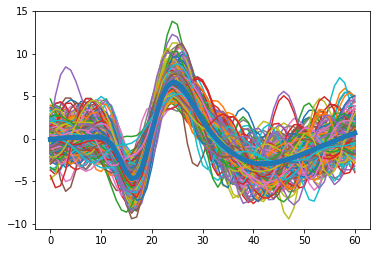

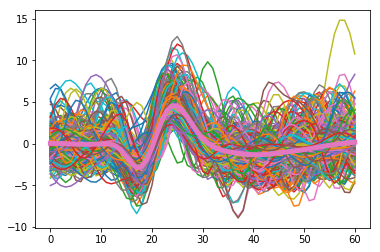

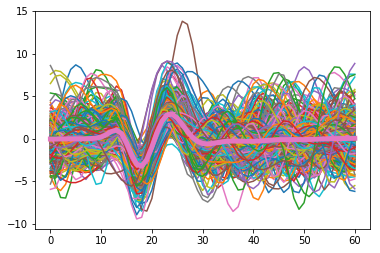

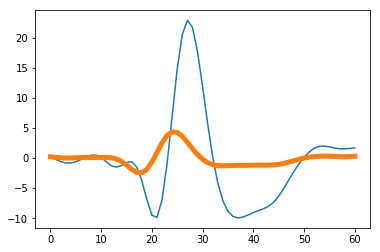

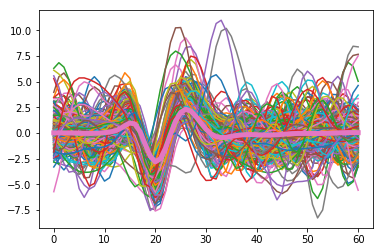

...

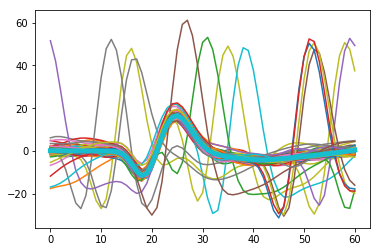

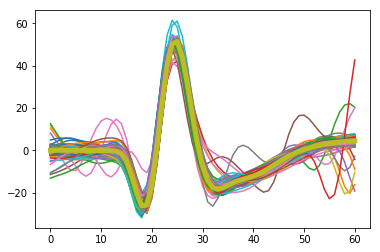

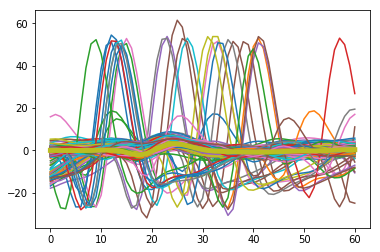

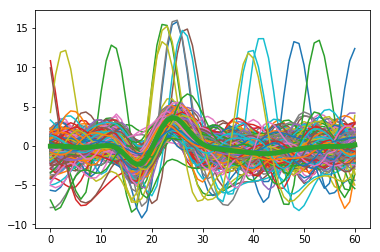

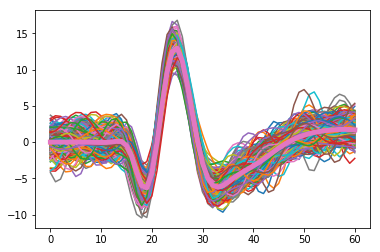

In [90]:
Ks = np.unique(spike_train[:, 1])
for j, k in enumerate(Ks):
    tt = spike_train[spike_train[:, 1] == k, 0]
    cc = principal_channels[k]
    wff = np.zeros((tt.shape[0], 61))
    for i in range(tt.shape[0]):
        wff[i] = recordings[tt[i]-R:tt[i]+R+1, cc]
    
    plt.plot(wff.T)
    plt.plot(templates[k,:,cc], linewidth=5)
    plt.show()

NameError: name 'spike_train' is not defined

In [32]:
def get_wf(recordings, spt):
    R = 30
    wf = np.zeros((spt.shape[0], 2*R+1, 49))
    for j in range(spt.shape[0]):
        if spt[j] > R and spt[j] < recordings.shape[0] - R:
            wf[j] = recordings[spt[j]-R:spt[j]+R+1]
            
    return wf

In [33]:
def find_caught(spt_base, spt):
    caught = np.zeros(spt_base.shape[0], 'bool')
    for j in range(spt_base.shape[0]):
        if np.sum(np.abs(spt_base[j] - spt) < 10) > 0:
            caught[j] =1
    return caught

In [34]:
import matplotlib

def scatter_plot(scores, label=None):
    
    # define the colormap
    cmap = plt.cm.jet
    # extract all colors from the .jet map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)
    if label is None:
        label = np.ones(scores.shape[0])
        
    plt.figure(figsize=(20,3))
    ax = plt.subplot(1,4,1)
    ax.scatter(scores[:,0,0], scores[:,1,0], c=label, cmap=cmap )
    plt.xlabel('x location')
    plt.ylabel('y location')
    
    plt.subplot(1,4,2)
    plt.scatter(scores[:,2,0], scores[:,3,0], c=label, cmap=cmap)
    plt.xlabel('feature 1')
    plt.ylabel('feature 2')

    plt.subplot(1,4,3)
    plt.scatter(scores[:,2,0], scores[:,4,0], c=label, cmap=cmap)
    plt.xlabel('feature 1')
    plt.ylabel('feature 3')
    
    plt.show()
    
    
    

In [114]:
_b = datetime.datetime.now()
max_d = np.max(d_max_along_shift, 1)
idx_good = argrelmax(max_d, order=(R+R_small)*2+1)[0]
spike_time = idx_good[max_d[idx_good] > threshold_d]
template_id, max_shift = np.unravel_index(
    np.argmax(np.reshape(d_matrix[spike_time],
                         (spike_time.shape[0], -1)),1),
    [n_templates, n_shifts])
print((datetime.datetime.now()-_b).total_seconds())


0.756093


In [602]:
tt1 = recordings[spike_time[:, np.newaxis] + np.arange(-R,R+1)]
tt2 = shifted_templates[max_shift,:,:,template_id]

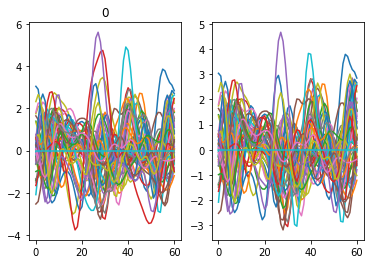

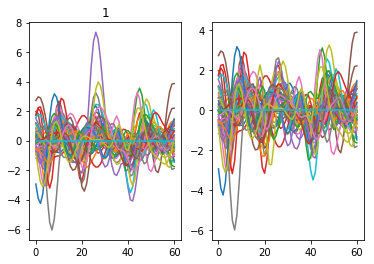

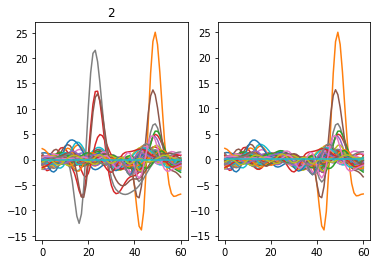

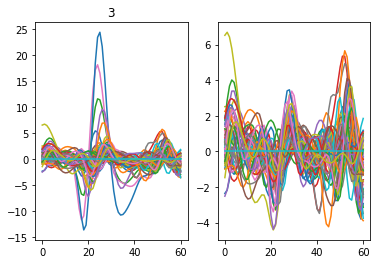

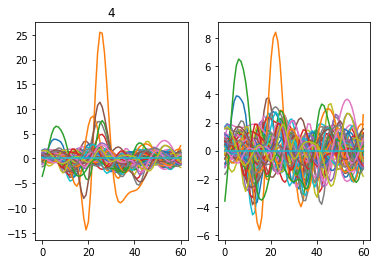

...

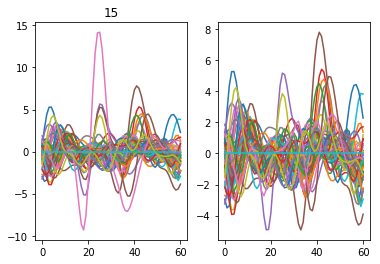

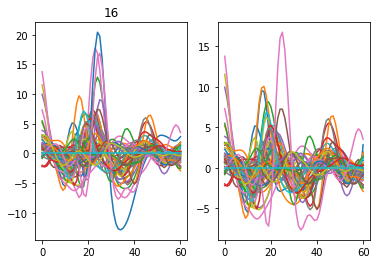

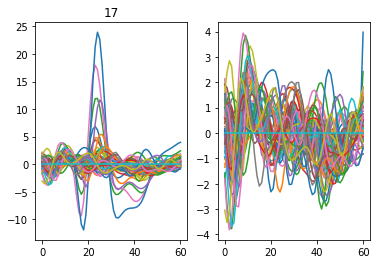

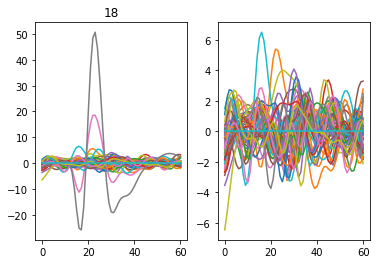

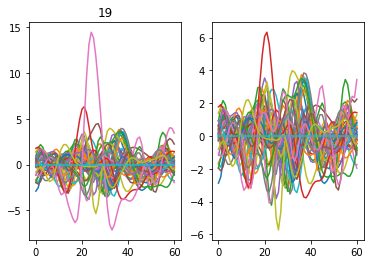

In [543]:
for j in range(20):
    plt.subplot(1,2,1)
    #plt.plot(tt1[j], color='red')
    #plt.plot(tt2[j], color='blue')
    plt.plot(tt1[j])
    plt.title(j)
    plt.subplot(1,2,2)
    plt.plot(tt1[j]-tt2[j])
    plt.show()

In [115]:
recordings[spike_time[:, np.newaxis] + np.arange(-R,R+1)
          ] -= shifted_templates[max_shift,:,:,template_id]

ref_, t_neigh, k_neigh = np.where(
    d_max_along_shift[spike_time[:, np.newaxis] + np.arange(
        -R-R_small,R+R_small+1)] > -np.Inf)
t_neigh_abs = spike_time[ref_] + t_neigh - R - R_small

In [126]:
k_consider = np.unique(k_neigh)
c_list = np.unique(principal_channels[k_consider])

for j, c in enumerate(c_list):
    t_consider = t_neigh_abs[k_neigh == k_consider[principal_channels[k_consider] == c][0]]
    tmp_idx = np.where(principal_channels==c)[0]

    ch_idx = channel_index[c]
    tmp_ = templates_small[tmp_idx]

    wf = recordings[
        t_consider[:, np.newaxis] + np.arange(
            -R_small, R_small+1)][
        :, :, ch_idx][:, :, :, np.newaxis]
    tmp_re = np.reshape(np.transpose(tmp_,(1, 2, 0, 3)),
                        [1, tmp_.shape[1], tmp_.shape[2], -1])

    new_val = 2*np.reshape(np.sum(wf*tmp_re, (1, 2)),(-1, tmp_.shape[0], n_shifts)) - norms[tmp_idx][np.newaxis]

    for i, k in enumerate(tmp_idx):
        d_matrix[t_consider, k] = new_val[:, i, :]

In [104]:
for k in range(n_templates):
    t_ = t_neigh_abs[k_neigh == k]
    if t_.shape[0] > 0:
        ch_idx = channel_index[principal_channels[k]]
        d_matrix[t_,k] = 2*np.sum(
            recordings[t_[:, np.newaxis] + np.arange(-R_small,R_small+1)
                      ][:, :, ch_idx, np.newaxis]*templates_small[
                [k]], (1, 2)) - norms[[k]]

In [48]:
aaa = temp_temp[k_neigh, template_id[ref_],
                :, max_shift[ref_], t_neigh]

In [127]:
d_matrix2[t_neigh_abs, k_neigh] -= 2*temp_temp[k_neigh, template_id[ref_],:, max_shift[ref_], t_neigh]

In [128]:
print(np.nanmax(np.abs(d_matrix-d_matrix2)))

/home/peter/miniconda3/envs/peter/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in subtract
  """Entry point for launching an IPython kernel.


2282.099530333695


In [199]:

spike_train_temp = np.hstack((spike_time[:, np.newaxis],
                              template_id[:, np.newaxis]))
spike_train = np.concatenate((spike_train, spike_train_temp), 0)        

d_max_along_shift[t_neigh_abs, k_neigh] = np.max(d_matrix[t_neigh_abs, k_neigh], 1)

In [56]:
spike_train = np.zeros((0, 2), 'int32')

In [ ]:
wf = recordings[
    spt[:, np.newaxis] + np.arange(
        -R_small-n_explore, n_explore+R_small+1)][
    :, :, ch_idx][:, :, :, np.newaxis]
tmp_re = np.reshape(np.transpose(tmp_,(1, 2, 0, 3)),
                    [1, tmp_.shape[1], tmp_.shape[2], -1])

kk = np.zeros((spt.shape[0], 2*n_explore+1, tmp_.shape[0], n_shifts))
for j in range(2*n_explore+1):
    kk[:, j] = np.reshape(np.sum(wf[:,j:j+2*R_small+1]*tmp_re,
                                 (1, 2)),(-1, tmp_.shape[0], n_shifts))
kk = 2*kk - norms[tmp_idx][np.newaxis, np.newaxis]  

for k in range(tmp_.shape[0]):
    d_matrix[spt[:, np.newaxis] + np.arange(
        -n_explore,n_explore+1), tmp_idx[k]] = kk[:, :, k]  



In [178]:
_b = datetime.datetime.now()
for j, c in enumerate(c_list):
    t_consider = t_neigh_abs[k_neigh == k_consider[principal_channels[k_consider] == c][0]]
    tmp_idx = np.where(principal_channels==c)[0]

    ch_idx = channel_index[c]
    tmp_ = templates_small[tmp_idx]

    wf = recordings[
        t_consider[:, np.newaxis] + np.arange(
            -R_small, R_small+1)][
        :, :, ch_idx][:, :, :, np.newaxis]
    tmp_re = np.reshape(np.transpose(tmp_,(1, 2, 0, 3)),
                        [1, tmp_.shape[1], tmp_.shape[2], -1])

    new_val = 2*np.reshape(np.sum(wf*tmp_re, (1, 2)),(-1, tmp_.shape[0], n_shifts)) - norms[tmp_idx][np.newaxis]

    for i, k in enumerate(tmp_idx):
        d_matrix[t_consider, k] = new_val[:, i, :]
print((datetime.datetime.now()-_b).total_seconds())

6.961747


In [253]:
max_d = np.max(d_max_along_shift, 1)

In [282]:
treshold_d = 0.5

In [274]:
idx_good2.shape

(287244,)

In [275]:
_b = datetime.datetime.now()
idx_good2 = np.where(max_d > threshold_d)[0]
idx_good3 = idx_good2[np.argmax(max_d[idx_good2[:, np.newaxis] + np.arange(-R-R_small,R+R_small+1)],1) == (R+R_small)]
print((datetime.datetime.now()-_b).total_seconds())

0.593501


In [283]:
_b = datetime.datetime.now()
idx_good = argrelmax(max_d, order=R+R_small)[0]
idx_good[max_d[idx_good]>threshold_d].shape
print((datetime.datetime.now()-_b).total_seconds())

0.364874


In [284]:
idx_good[max_d[idx_good]>threshold_d].shape

(10535,)

In [285]:
_b = datetime.datetime.now()
idx_good2 = argrelmax(max_d)[0]
idx_good3 = idx_good2[np.argmax(max_d[idx_good2[:, np.newaxis] + np.arange(-R-R_small,R+R_small+1)],1) == (R+R_small)]
idx_good3[max_d[idx_good3]>threshold_d].shape
print((datetime.datetime.now()-_b).total_seconds())

0.049401


In [287]:
idx_good3[max_d[idx_good3]>threshold_d].shape

(10535,)

In [203]:
np.max((max_d[161-45:161+46]))

387.23012050864486

In [204]:
max_d[161]

387.23012050864486

In [196]:
idx_good[:10]

array([ 253,  429,  583,  850, 1029, 1288, 1500, 1659, 1782, 1930])

(10535,)

In [162]:
max_d.shape

(1000000,)

In [228]:
d_matrix[template_id]

(1000000, 49, 3)

In [227]:
template_id

array([40])

In [234]:
template_id.shape

(1,)

(1, 61, 3)

In [231]:
(spike_time[:, np.newaxis] + np.arange(
            -R-R_small,R+R_small+1)).shape

(1, 91)

In [246]:
d_matrix[rf_area, np.tile(template_id[:,np.newaxis],(1, 2*R+1))]

(10535, 61, 3)

In [313]:
_b = datetime.datetime.now()
while np.max(d_max_along_shift) > threshold_d:

    print(np.max(d_max_along_shift))
    max_d = np.max(d_max_along_shift, 1)
    peaks = argrelmax(max_d)[0]
    idx_good = peaks[np.argmax(max_d[peaks[:, np.newaxis] + np.arange(-R-R_small,R+R_small+1)],1) == (R+R_small)]
    spike_time = idx_good[max_d[idx_good] > threshold_d]
    template_id, max_shift = np.unravel_index(
        np.argmax(np.reshape(d_matrix[spike_time],
                             (spike_time.shape[0], -1)),1),
        [n_templates, n_shifts])
   
    rf_area = spike_time[:, np.newaxis] + np.arange(-R,R+1)
    rf_area_t = np.tile(template_id[:,np.newaxis],(1, 2*R+1))
    d_matrix[rf_area, rf_area_t] = -np.Inf
    d_max_along_shift[rf_area, rf_area_t] = -np.Inf

    print((datetime.datetime.now()-_b).total_seconds())
    kk = d_max_along_shift[spike_time[:, np.newaxis] + np.arange(
            -R-R_small,R+R_small+1)]
    print((datetime.datetime.now()-_b).total_seconds())
    
    ref_, t_neigh, k_neigh = np.where(kk
         > -np.Inf)
    
    print((datetime.datetime.now()-_b).total_seconds())
    
    t_neigh_abs = spike_time[ref_] + t_neigh - R - R_small

    print((datetime.datetime.now()-_b).total_seconds())
    d_matrix[t_neigh_abs, k_neigh] -= 2*temp_temp[k_neigh, template_id[ref_],:, max_shift[ref_], t_neigh]
    
    #spike_train_temp = np.hstack((spike_time[:, np.newaxis],
    #                              template_id[:, np.newaxis]))
    #spike_train = np.concatenate((spike_train, spike_train_temp), 0)        

    d_max_along_shift[t_neigh_abs, k_neigh] = np.max(d_matrix[t_neigh_abs, k_neigh], 1)
    print((datetime.datetime.now()-_b).total_seconds())

4700.662485848804
0.263993
0.596877
0.728279
0.734199
0.927517
2757.6347585149388
1.143062
1.417124
1.53386
1.538866
1.699495
1993.254951538837
1.905401
2.152683
2.257967
2.262238
2.407087
1146.0080588124963
2.60839
2.821032
2.912454
2.916209
3.044235
590.1013533084957
3.203283
3.382606
3.459724
3.462801
3.568959
554.6108693219551
3.725746
3.870784
3.934227
3.936757
4.025799
484.13388968301433
4.214402
4.32272
4.370256
4.371954
4.4408
328.19277239518163
4.588535
4.668264
4.703391
4.704769
4.756207
285.61919413627294


KeyboardInterrupt: 

In [26]:
max_d = np.max(d_max_along_shift, 1)
idx_good = argrelmax(max_d, order=n_temporal_big)[0]
spike_time = idx_good[max_d[idx_good] > threshold_d]
template_id, max_shift = np.unravel_index(
    np.argmax(np.reshape(d_matrix[spike_time],
                         (spike_time.shape[0], -1)),1),
    [n_templates, n_shifts])



In [27]:
spike_time

array([ 241,  430,  695,  847,  959, 1657, 1927, 2297, 2479, 2676, 2817,
       2955, 3113, 3535, 3671, 3843, 3967, 4402, 4538, 4682, 4769, 4853,
       4951, 5256, 5453, 5573, 5856, 6298, 6492, 6918, 7082, 7379, 7560,
       7881, 8048, 8222, 8376, 8602, 9076, 9191, 9278, 9654, 9888])

100%|██████████| 49/49 [02:09<00:00,  2.65s/it]


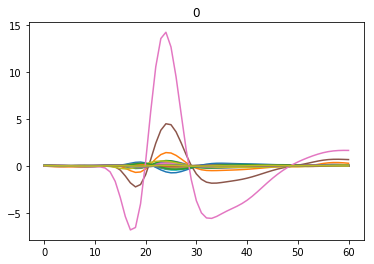

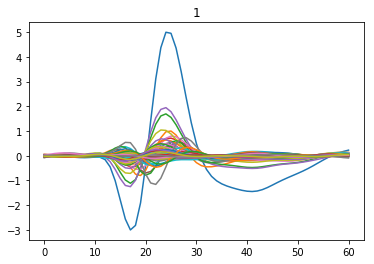

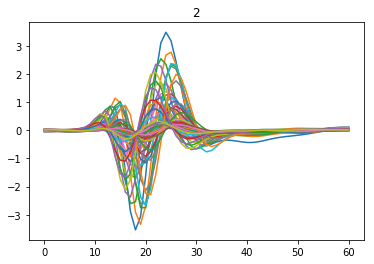

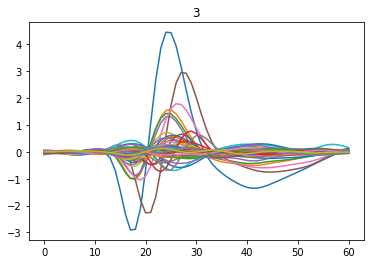

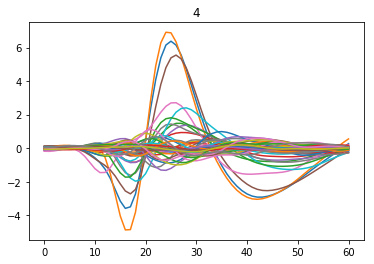

...

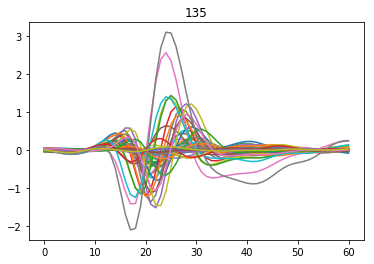

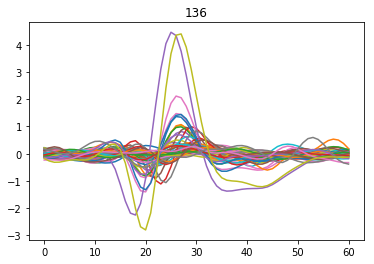

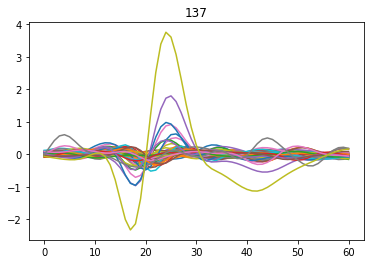

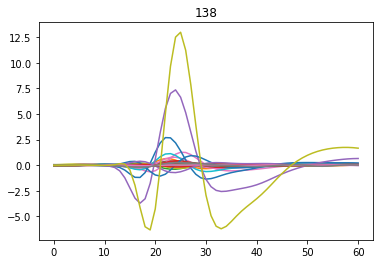

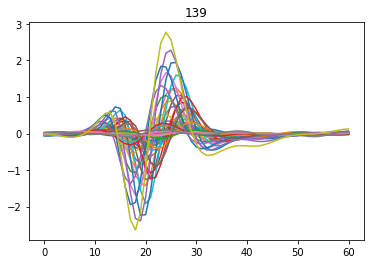

In [9]:
for j in range(templates.shape[2]):
    plt.plot(templates[:,:,j].T)
    plt.title(j)
    plt.show()